In [ ]:
# This Notebook loads a dataset to memory, calculates NDVI, and plots the results, using a cloud mask.
# NDVI = (NIR - RED) / (NIR + RED)

In [1]:
import datacube
from datacube.storage import masking

dc = datacube.Datacube()

In [11]:
# Build the query dictionary
query = { 
    'product' : 'LC08_scene'
    , 'time' : ('2017-07-05','2017-08-23')
    , 'latitude' : (47.7838, 49.93203)
    , 'longitude' : (-124.35999, -121.14917)
    , 'measurements' : ['red', 'nir', 'quality']
    , 'resolution' : (-0.0025, 0.0025)
}

In [12]:
dc.find_datasets(**query)

[Dataset <id=89d2a48b-8594-50f2-b24c-2a2282ad766d type=LC08_scene location=/data/datacube/in/landsat/LC08_L1TP_049025_20170804_20170812_01_T1/metadata.yaml>,
 Dataset <id=ddbc50df-7a31-5790-8eca-8e5635e7900a type=LC08_scene location=/data/datacube/in/landsat/LC08_L1TP_048026_20170728_20170810_01_T1/metadata.yaml>,
 Dataset <id=c29ba58a-238f-5408-8876-e6f7f3ae6e3d type=LC08_scene location=/data/datacube/in/landsat/LC08_L1TP_047026_20170822_20170912_01_T1/metadata.yaml>,
 Dataset <id=b27142ef-6a7c-5581-bafd-d3a2aaad8968 type=LC08_scene location=/data/datacube/in/landsat/LC08_L1TP_047026_20170806_20170813_01_T1/metadata.yaml>,
 Dataset <id=2c25bc23-47bf-5860-a4c9-07679967d3bc type=LC08_scene location=/data/datacube/in/landsat/LC08_L1TP_047026_20170705_20170716_01_T1/metadata.yaml>]

In [13]:
two_bands = dc.load(**query)

In [19]:
# Isolate all valid data in the the two bands of interest
red = two_bands.red.where(two_bands.red != two_bands.red.attrs['nodata'])
nir = two_bands.nir.where(two_bands.nir != two_bands.nir.attrs['nodata'])


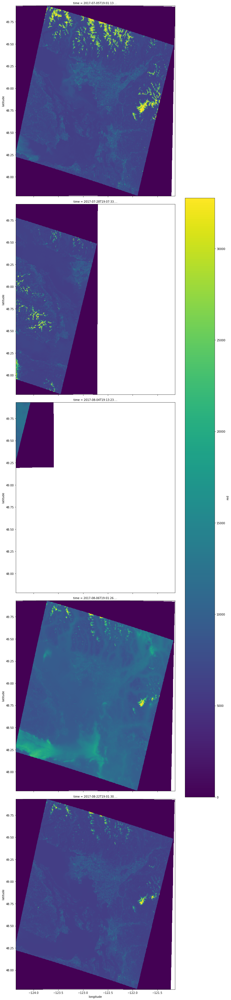

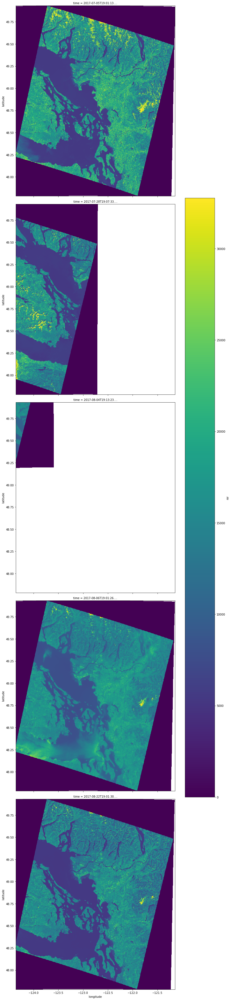

In [20]:
red.plot(col='time', col_wrap = 1, size = 10)
nir.plot(col='time', col_wrap = 1, size = 10)

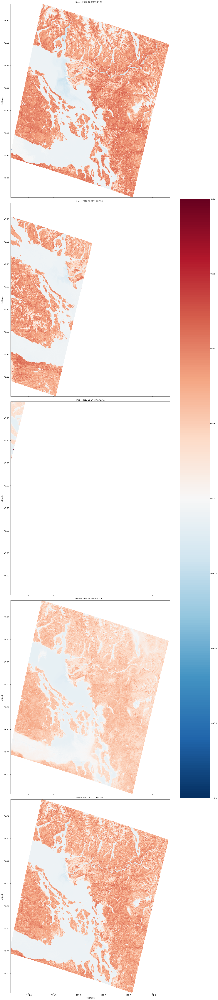

In [24]:
#Calculate and plot the NDVI
ndvi = ((nir - red) / (nir + red))
ndvi.plot(col='time', col_wrap = 1, size = 15)

In [22]:
# Prepare the pixel quality band as a cloud mask
cloud_free = masking.make_mask(two_bands, cloud=False).quality

In [23]:
ndvi = ndvi.where(cloud_free)

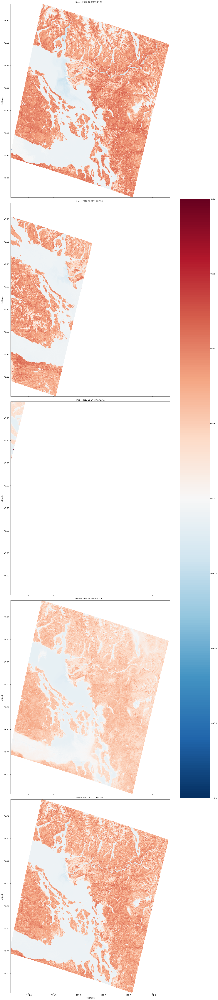

In [25]:
ndvi.plot(col='time', col_wrap = 1 , size = 15)